In [1]:
import pandas as pd
import json
import re
import tifffile as tiff
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.patches as patches

from PIL import Image
from tqdm import tqdm

from sklearn.linear_model import LinearRegression


import cv2


## Take some images

In [2]:
with tiff.TiffFile('1.tif') as tif:
    frame = tif.asarray()[:, :, 0]
print(frame.shape)

(1200, 2000)


In [3]:
frame = frame[150:-150, :]

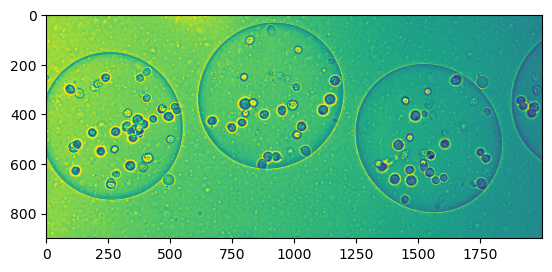

In [4]:
plt.imshow(frame)

In [5]:
me = np.mean(frame, axis = 0).reshape(-1)
print(me.shape)

(2000,)


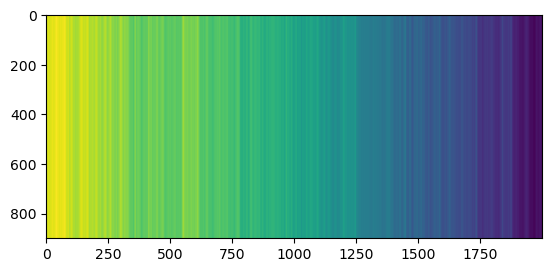

In [6]:
plt.imshow(np.tile(me[np.newaxis, :], (frame.shape[0], 1)))

In [49]:
im = frame - me

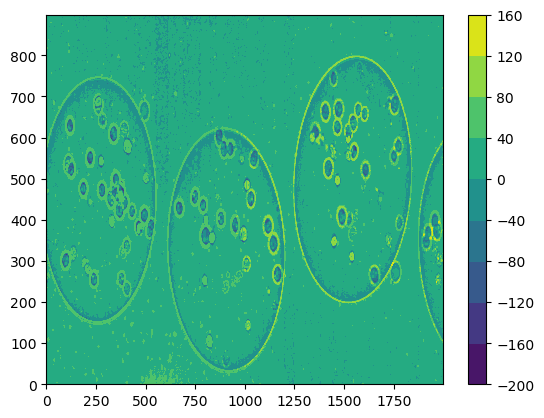

In [52]:
plt.contourf(im)
plt.colorbar()

(array([1., 1., 0., ..., 1., 0., 2.]),
 array([-178.28444444, -178.00458259, -177.72472073, ...,  134.0413874 ,
         134.32124925,  134.60111111]),
 <BarContainer object of 1118 artists>)

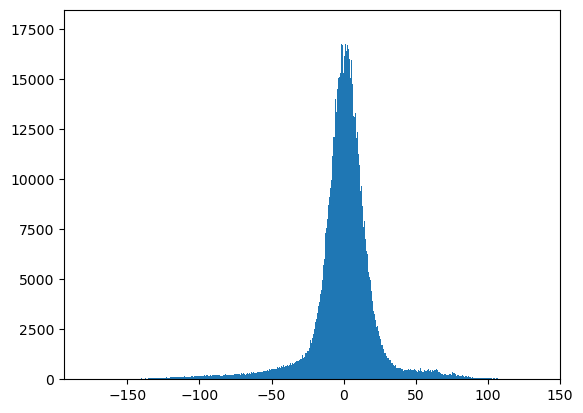

In [53]:
plt.hist(im.reshape(-1), bins = 'auto')

In [54]:
mask = np.zeros_like(im)


In [86]:
inds0, inds1 = np.where(im > 160)

mask[inds0, inds1] = 1

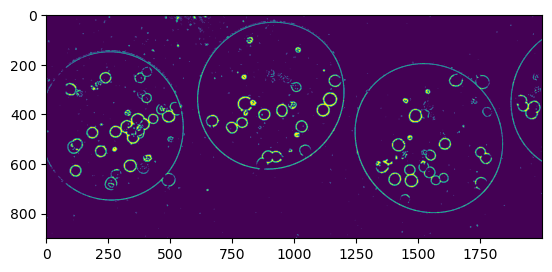

In [87]:
plt.imshow(mask)

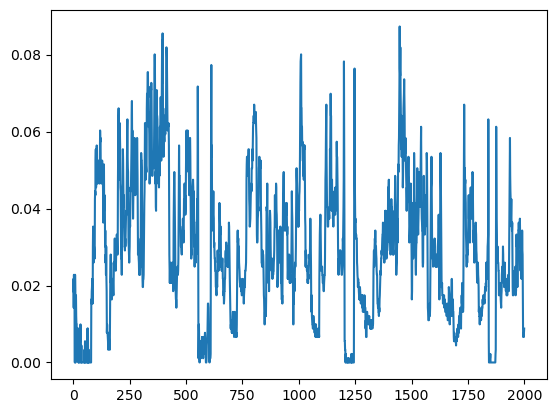

In [64]:
plt.plot(np.var(mask, axis = 0))

In [61]:
radius = 15  # You can adjust the radius based on your requirements
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))

# Perform closing
bg = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

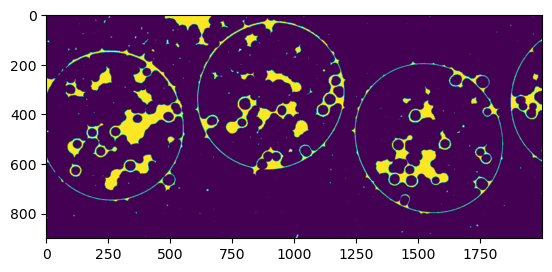

In [62]:
plt.imshow(bg)

In [65]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.preprocessing import normalize

In [66]:
n_clusters = 70

kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=42)


In [88]:
idx, idy = np.where(mask == 1)

In [89]:
d = np.hstack((idx.reshape(-1, 1), idy.reshape(-1, 1)))

In [75]:
print(d.shape)

(32, 2)


In [82]:
print(np.unique(idy))

[1762]


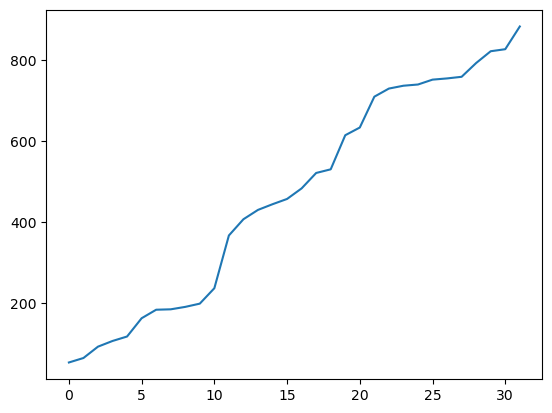

In [78]:
plt.plot(d[:, 0])

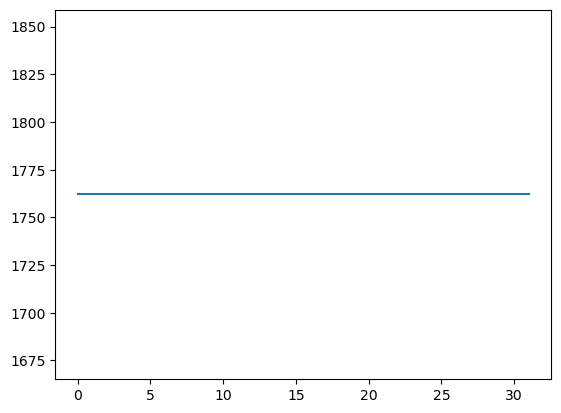

In [79]:
plt.plot(d[:, 1])

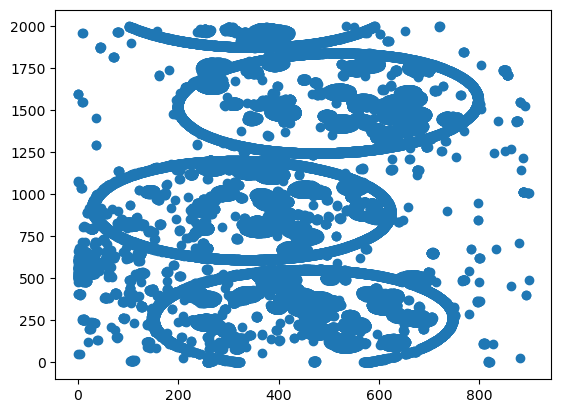

In [90]:
plt.scatter(d[:, 0], d[:, 1])

In [91]:
kmeans.fit(d)

/home/jpierre/anaconda3/envs/myenvPy/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans(n_clusters=70, random_state=42)

In [92]:
initial_cluster_centers = kmeans.cluster_centers_

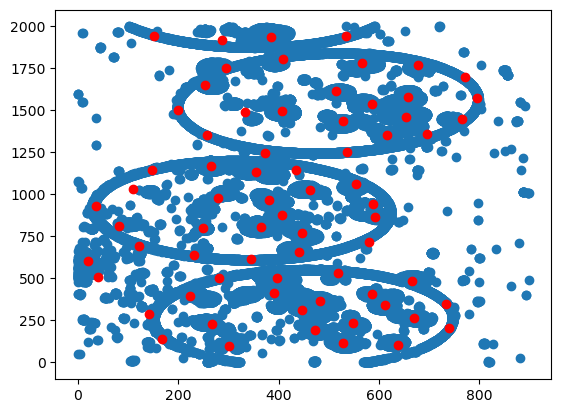

In [96]:
plt.scatter(d[:, 0], d[:, 1])
plt.scatter(initial_cluster_centers[:, 0],initial_cluster_centers[:, 1] , color='r')

Text(0.5, 1.0, 'Sobel Magnitude')

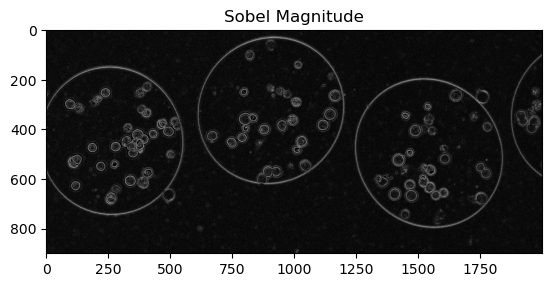

In [7]:
sobel_x = cv2.Sobel(frame, cv2.CV_64F, 1, 0, ksize=3)  # Sobel filter along the x-axis
sobel_y = cv2.Sobel(frame, cv2.CV_64F, 0, 1, ksize=3)  # Sobel filter along the y-axis

# Calculate the magnitude of the gradient
magnitude = np.sqrt(sobel_x**2 + sobel_y**2)


plt.imshow(magnitude, cmap='gray')
plt.title('Sobel Magnitude')


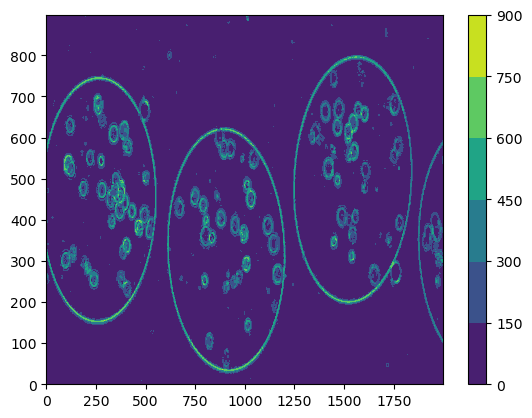

In [8]:
plt.contourf(magnitude)
plt.colorbar()

In [9]:
test = (magnitude > 150).astype(np.uint8) * 255

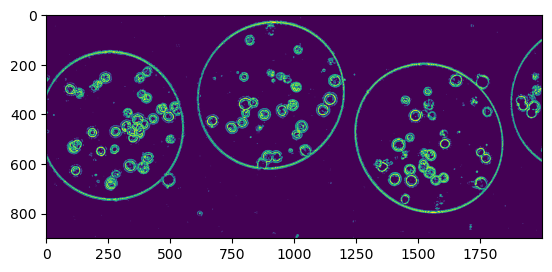

In [10]:
plt.imshow(test)

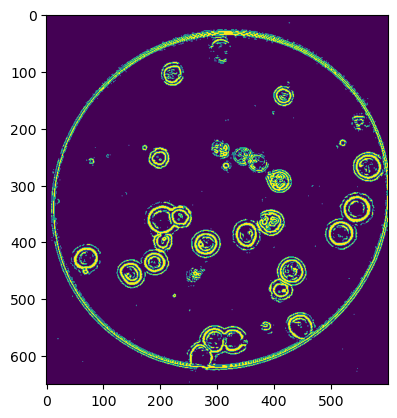

In [13]:
im2 = test[0:650,600:1200]
plt.imshow(im2)

In [49]:
circles = cv2.HoughCircles(im2, cv2.HOUGH_GRADIENT, 1, 20, param1=1000, param2=10, minRadius=10, maxRadius=20)

In [51]:
print(circles.shape)

(1, 36, 3)


In [45]:
imb = frame[0:650,600:1200]

In [46]:
print(circles)

[[[327.5 572.5  19.4]
  [544.5 342.5  18.2]
  [396.5 365.5  19.4]
  [197.5 252.5  18.3]
  [563.5 269.5  19.4]
  [434.5 451.5  19.4]
  [515.5 385.5  16.3]
  [414.5 481.5  19.4]
  [280.5 405.5  17.2]
  [444.5 550.5  19.4]
  [219.5 102.5  17.2]
  [ 71.5 433.5  19.4]
  [187.5 435.5  16. ]
  [148.5 459.5  19.4]
  [408.5 291.5  19.4]
  [203.5 367.5  19.4]
  [235.5 359.5  19.4]
  [348.5 385.5  17.2]
  [289.5 573.5  19.4]
  [269.5 602.5  19.4]
  [200.5 400.5  17.2]
  [415.5 144.5  16.1]
  [307.5 236.5  13.8]
  [344.5 251.5  14.9]
  [307.5 604.5  19.4]
  [372.5 261.5  17.2]
  [307.5  65.5  19.4]
  [361.5  48.5  19.4]
  [ 45.5 449.5  17.2]
  [339.5 603.5  17.2]
  [232.5 384.5  17.2]
  [474.5 542.5  13.8]
  [556.5 184.5  11.6]
  [314.5 259.5  11.6]
  [476.5  61.5  19.4]
  [177.5 377.5  16. ]]]


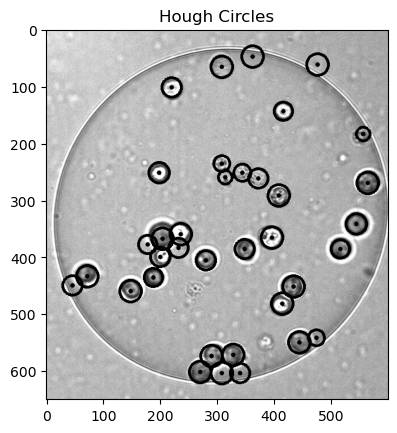

In [47]:
circles = np.uint16(np.around(circles))

img_with_circles = np.copy(imb)

for c in circles[0, :]:
    # Draw the outer circle
    cv2.circle(img_with_circles, (c[0], c[1]), c[2], (0, 255, 0), 3)
    # Draw the center of the circle
    cv2.circle(img_with_circles, (c[0], c[1]), 1, (0, 0, 255), 5)

# Display the image with circles using plt
plt.imshow(cv2.cvtColor(img_with_circles, cv2.COLOR_BGR2RGB))
plt.title('Hough Circles')
plt.show()

In [52]:
def nbCells(im, display = False):
    sobel_x = cv2.Sobel(frame, cv2.CV_64F, 1, 0, ksize=3)  # Sobel filter along the x-axis
    sobel_y = cv2.Sobel(frame, cv2.CV_64F, 0, 1, ksize=3)
    
    magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
    
    test = (magnitude > 150).astype(np.uint8) * 255
    
    circles = cv2.HoughCircles(im2, cv2.HOUGH_GRADIENT, 1, 20, param1=1000, param2=10, minRadius=10, maxRadius=20)
    
    if display:
        circles = np.uint16(np.around(circles))

        img_with_circles = np.copy(imb)

        for c in circles[0, :]:
            # Draw the outer circle
            cv2.circle(img_with_circles, (c[0], c[1]), c[2], (0, 255, 0), 3)
            # Draw the center of the circle
            cv2.circle(img_with_circles, (c[0], c[1]), 1, (0, 0, 255), 5)

        # Display the image with circles using plt
        plt.imshow(cv2.cvtColor(img_with_circles, cv2.COLOR_BGR2RGB))
        plt.title('Hough Circles')
        plt.show()
    
    return circles.shape[1]

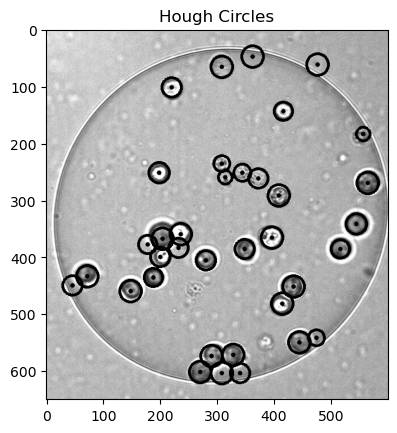

36

In [53]:
nbCells(test, display=True)

## BG subtraction (for test, I will take a simple one)

In [3]:
def medianInit(frames:np.array)->np.array:
    """ 
    Function to initialize the background from the first frames

    Args:
    -----
    - `frames`: starting frames
    """
    bg = None

    for f in frames:
        if bg is None:
            bg = f.reshape(1, *f.shape)

        else:
            bg = np.vstack((bg, f.reshape(1, *f.shape)))

    return np.median(bg, axis=0).astype(int)





class background_sub():
    def __init__(self, frames, params):
        self.frames = frames

        self.alpha = params[0]                  # exponential filter

        self.threshold = params[1]              # threshold comparison

        self.nbIinit = params[2]                # number of frames to wait for the bg init

        self.initFrameId = params[2]-1           # id of the first frame

        self.methodUpdate = params[3]           # 0  if alpha is constnat, 1 for decreasing alpha

        self.nbFrames = 0                       # number of frames for the decreasing alpha

        self.binMaps = []                       # list of binary maps

        self.initVersion = params[4]            # 0: model, 1: median
        
    def _initBg(self, frames: list)->np.array:
        """ 
        Initialization of the algorithm

        Args:
        -----
        - `frames`: list of frames from which the init background is obtained
        """
        
        if self.initVersion == 0:
            bg = initialBackgroundv2(frames[0])     
        elif self.initVersion == 1:
            bg = medianInit(frames[:self.nbIinit])

        return bg

    def _updateBg(self, prevBg:np.array, frame:np.array, alpha:float, bMap:np.array)->np.array:
        """ 
        Function to perform the update

        Args:
        -----
        -`prevBg`: previous background
        - `frame`: current frame
        - `alpha`: learning rate
        - `bMap`: binary map from background subtraction (not used)
        """
        return ((1-alpha) * prevBg + alpha * frame)

    
    def _compareFrames(self, frame:np.array, bg:np.array, threshold:float)->np.array:
        """  
        Function to compare the background and the foreground

        Args:
        -----
        - `frame`: foreground
        - `bg`: background
        - `threshold`: threshold in the comparison

        Returns:
        --------
        The binary map
        """

        d = np.abs(bg - frame)

        bMap = (d >= threshold)
        return bMap


    def _loop(self):
        """ 
        Main function to apply the background subtraction algorithm
        """

        ## initialize the background
        bg = self._initBg(self.frames)

        for i in range(self.initFrameId, len(self.frames)):

            ## compare background and foreground
            bMap = self._compareFrames(self.frames[i], bg, self.threshold)
            
            self.binMaps.append(bMap)

            ## get the current alpha
            if self.methodUpdate:
                alpha = self.alpha / (self.nbFrames+1)
                self.nbFrames += 1
            else:
                alpha = self.alpha

            # update the background
            bg = self._updateBg(bg, self.frames[i], self.alpha, bMap)

            bg = bg.astype(int)
        return self.binMaps
    

bgS2 = background_sub(f, [0.10, 60, 6, 1, 1])

bMap = bgS2._loop()

AxisError: axis 0 is out of bounds for array of dimension 0

In [ ]:
plt.imshow(frames[15])
plt.show()
plt.imshow(bMap[10], cmap='gray')
plt.show()

In [123]:
# lets focus on frames 15

bg = bMap[10].astype(dtype=np.uint8) * 255
im = frames[15]

### Test for finding the different droplets

In [124]:
radius = 15  # You can adjust the radius based on your requirements
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))

# Perform closing
bg = cv2.morphologyEx(bg, cv2.MORPH_CLOSE, kernel)

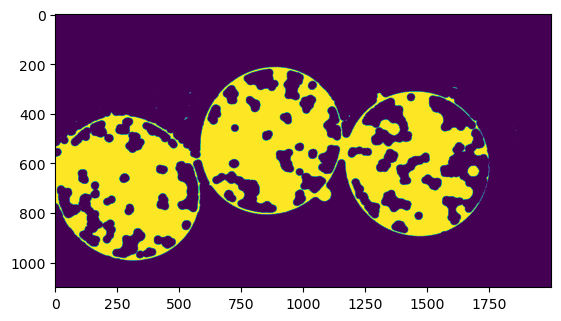

In [125]:
plt.imshow(bg)

In [126]:
dist_transform = cv2.distanceTransform(bg, cv2.DIST_L2, 5)


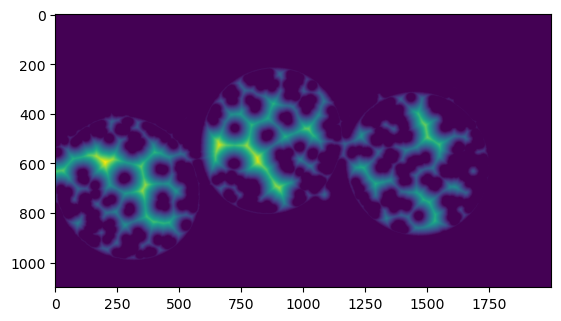

In [127]:
plt.imshow(dist_transform)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[ 0.        1.        1.4      ... 81.372116 81.88838  81.95349 ]
[0 1]


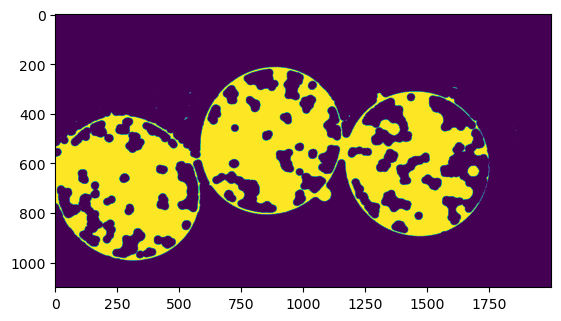

In [170]:
t = (dist_transform > 0).astype(np.uint8)
print(dist_transform)
print(np.unique(dist_transform))
print(np.unique(t))
plt.imshow(t.astype(np.uint8))

In [87]:
dist = cv2.distanceTransform(bg, cv2.DIST_L2, 5) 

In [89]:
ret, markers = cv2.connectedComponents(dist) 
  
# Add one to all labels so that background is not 0, but 1 
markers += 1
# mark the region of unknown with zero 
markers[bg == 255] = 0
  


error: OpenCV(4.8.1) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\connectedcomponents.cpp:5632: error: (-215:Assertion failed) iDepth == CV_8U || iDepth == CV_8S in function 'cv::connectedComponents_sub1'


In [138]:
_, markers = cv2.threshold(dist_transform, 0.1 * dist_transform.max(), 255, 0)


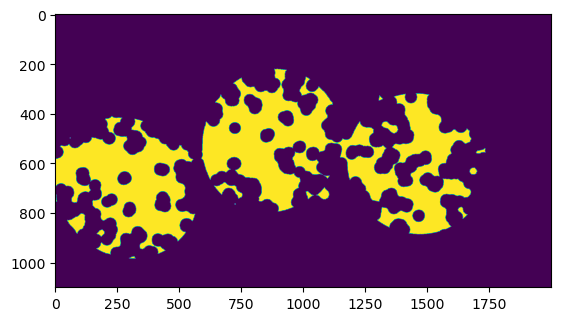

In [139]:
plt.imshow(markers)

In [145]:
import cv2
import numpy as np

# Assuming markers is your input array
markers = np.int32(markers)

# Ensure markers is of type CV_32S (32-bit signed integer)
if markers.dtype != np.int32:
    markers = markers.astype(np.int32)

# Create a mask using the markers
mask = (markers > 0).astype(np.uint8) * 255

# Apply connectedComponents
num_labels, labeled_markers = cv2.connectedComponents(mask, connectivity=8, ltype=cv2.CV_32S)


In [146]:
markers += 1  

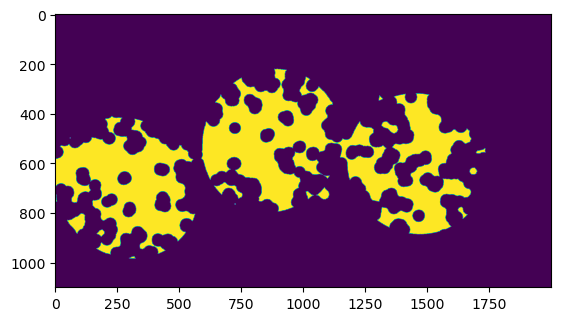

In [147]:
plt.imshow(markers)

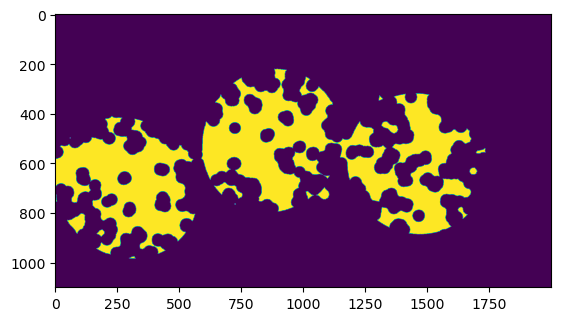

In [148]:
plt.imshow(markers)

In [151]:
im2 = cv2.watershed(im, markers)


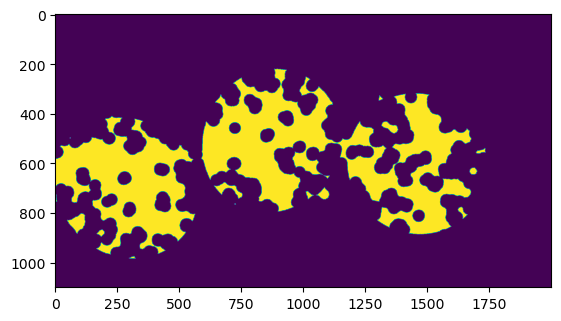

In [152]:
plt.imshow(im2)

In [153]:
print(np.unique(im2))

[ -1   1 256]


In [154]:
im2[im2 == 256] = 2

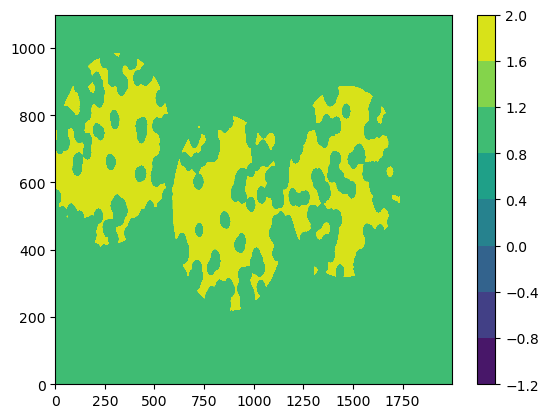

In [158]:
plt.contourf(markers)
plt.colorbar()

## -----test 2

In [ ]:
# compute bg

# closing



In [172]:
# lets focus on frames 15

bg = bMap[10].astype(dtype=np.uint8) * 255
im = frames[15]

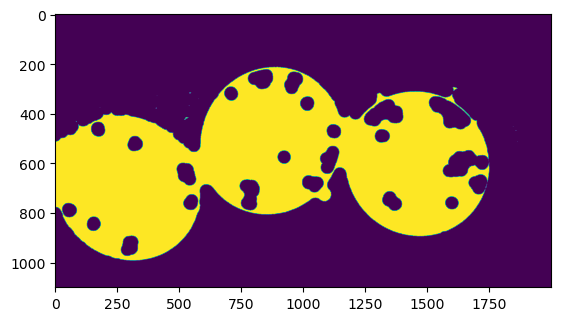

In [286]:
radius = 25  # You can adjust the radius based on your requirements
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))
bin_img = cv2.morphologyEx(bg,  
                           cv2.MORPH_CLOSE, 
                           kernel, 
                           iterations=1) 
plt.imshow(bin_img) 

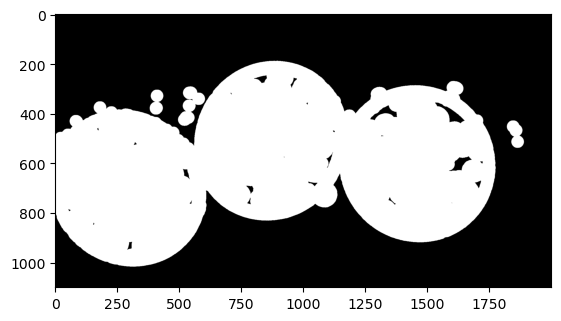

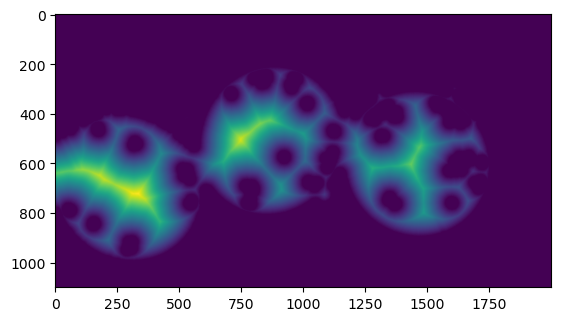

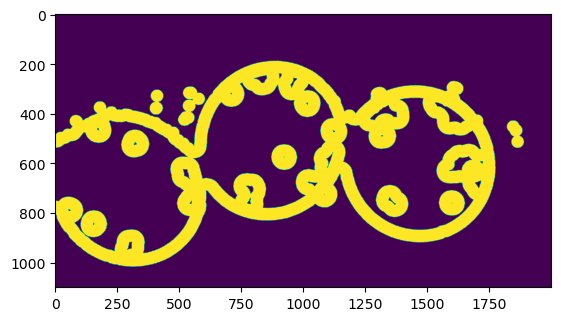

In [287]:
# sure background area 
sure_bg = cv2.dilate(bin_img, kernel, iterations=1) 
plt.imshow(sure_bg, cmap='gray') 
plt.show()  
# Distance transform 
dist = cv2.distanceTransform(bin_img, cv2.DIST_L2, 5) 
plt.imshow(dist) 
plt.show()  
  
#foreground area 
ret, sure_fg = cv2.threshold(dist, 0.15 * dist.max(), 255, cv2.THRESH_BINARY) 
sure_fg = sure_fg.astype(np.uint8)   
plt.show()  
  
# unknown area 
unknown = cv2.subtract(sure_bg, sure_fg) 
plt.imshow(unknown) 
  
plt.show()

[1 2 3 4 5 6]


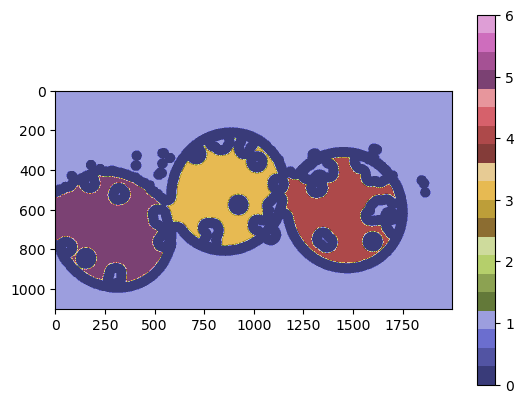

In [288]:
# Marker labelling 
# sure foreground  
ret, markers = cv2.connectedComponents(sure_fg) 
  
# Add one to all labels so that background is not 0, but 1 
markers += 1

print(np.unique(markers))
# mark the region of unknown with zero 
markers[unknown == 255] = 0
  
plt.imshow(markers, cmap="tab20b") 
plt.colorbar()

plt.show()

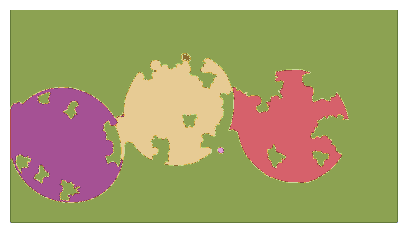

[-1  1  2  3  4  5  6]


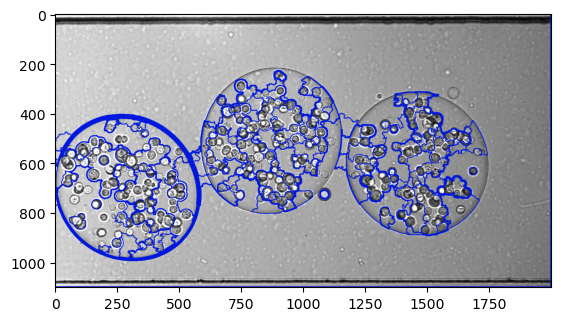

In [289]:
# watershed Algorithm 
markers = cv2.watershed(im, markers) 
  
fig, ax = plt.subplots(figsize=(5, 5)) 
ax.imshow(markers, cmap="tab20b") 
ax.axis('off') 
plt.show() 
  
  
labels = np.unique(markers) 
print(labels)
  
coins = [] 
for label in labels:   
  
# Create a binary image in which only the area of the label is in the foreground  
#and the rest of the image is in the background    
    target = np.where(markers == label, 255, 0).astype(np.uint8) 
    
  # Perform contour extraction on the created binary image 
    contours, hierarchy = cv2.findContours( 
        target, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE 
    ) 
    coins.append(contours[0]) 
  
# Draw the outline 
img = cv2.drawContours(im, coins, -1, color=(0, 23, 223), thickness=2) 
plt.imshow(img)

## idees

closing -> dilation
        -> erosion

        -> subtract the two (get the contour)
        -> bingo (larger estimate of the droplet + allows to determine centers ~ segmentation if necessary from there)

OR:
closing -> dilation
        -> erosion
        -> hough transform

In [362]:
bg = bMap[10].astype(dtype=np.uint8) * 255
im = frames[15]

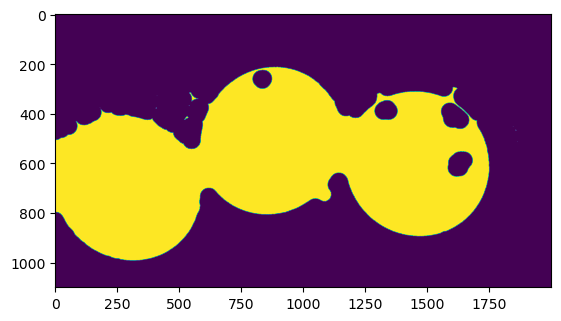

In [363]:
# closing

radius = 35  # You can adjust the radius based on your requirements
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))
bin_img = cv2.morphologyEx(bg,  
                           cv2.MORPH_CLOSE, 
                           kernel, 
                           iterations=1) 
plt.imshow(bin_img) 

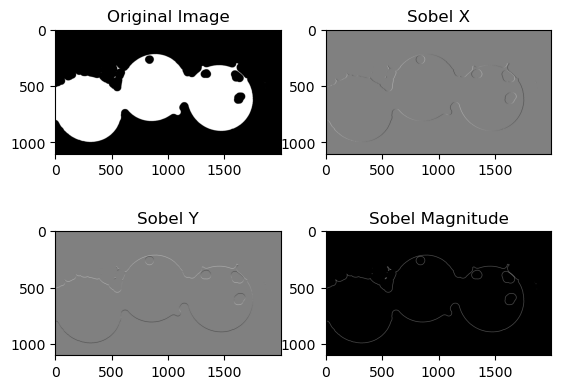

In [371]:
sobel_x = cv2.Sobel(bin_img, cv2.CV_64F, 1, 0, ksize=3)  # Sobel filter along the x-axis
sobel_y = cv2.Sobel(bin_img, cv2.CV_64F, 0, 1, ksize=3)  # Sobel filter along the y-axis

# Calculate the magnitude of the gradient
magnitude = np.sqrt(sobel_x**2 + sobel_y**2)

# Display the original image and the Sobel-filtered images
plt.subplot(2, 2, 1), plt.imshow(bin_img, cmap='gray'), plt.title('Original Image')
plt.subplot(2, 2, 2), plt.imshow(sobel_x, cmap='gray'), plt.title('Sobel X')
plt.subplot(2, 2, 3), plt.imshow(sobel_y, cmap='gray'), plt.title('Sobel Y')
plt.subplot(2, 2, 4), plt.imshow(magnitude, cmap='gray'), plt.title('Sobel Magnitude')

plt.show()

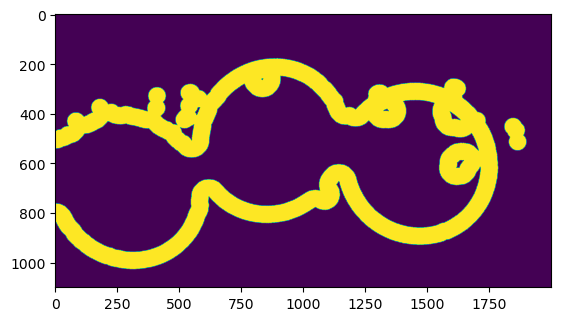

In [298]:
# dilatino

dilatedBg = cv2.dilate(bin_img, kernel, iterations=1) 
plt.imshow(dilatedBg)

erodedBg = cv2.erode(bin_img, kernel, iterations=1) 

plt.imshow(erodedBg)

im2 = dilatedBg - erodedBg
plt.imshow(im2)

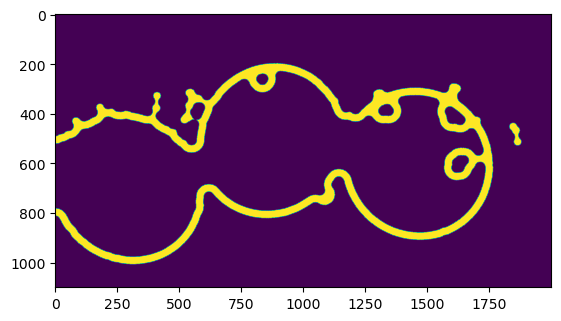

In [340]:
radius = 20  # You can adjust the radius based on your requirements
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))
erodedIm = cv2.erode(im2, kernel, iterations=1) 
plt.imshow(erodedIm)

In [380]:
print(erodedIm)
print(np.unique(erodedIm))

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[  0 255]


In [382]:
i = (magnitude > 0).astype(np.uint8) * 255
print(np.unique(i))

[  0 255]


In [384]:
circles = cv2.HoughCircles(i, cv2.HOUGH_GRADIENT, 1.3, 300, param1=120, param2=45, minRadius=100, maxRadius=0)

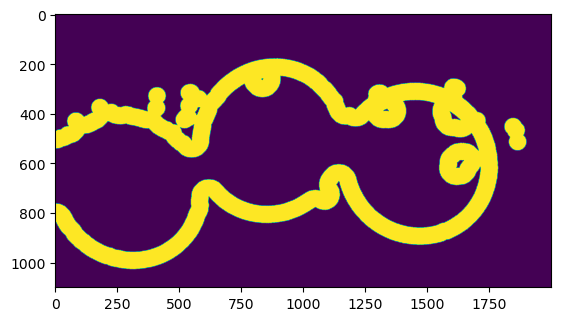

In [352]:
plt.imshow(im2)

In [385]:
print(circles)

[[[1464.45     607.75     286.41998]
  [ 858.64996  502.44998  302.28   ]
  [ 303.55     693.55     296.16998]]]


In [386]:
print(circles.shape)

(1, 3, 3)


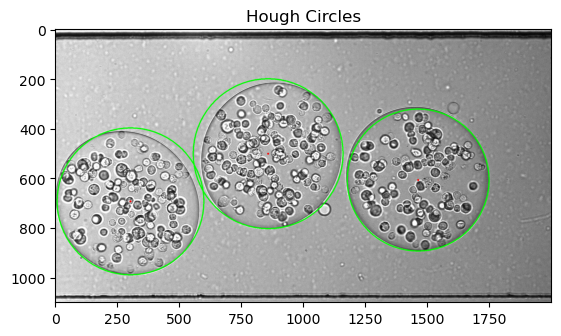

True

In [387]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Assuming circles is your array of detected circles
# Assuming img is your original image

circles = np.uint16(np.around(circles))

# Create a copy of the original image to draw circles without affecting it
img_with_circles = np.copy(im)

for c in circles[0, :]:
    # Draw the outer circle
    cv2.circle(img_with_circles, (c[0], c[1]), c[2], (0, 255, 0), 3)
    # Draw the center of the circle
    cv2.circle(img_with_circles, (c[0], c[1]), 1, (0, 0, 255), 5)

# Display the image with circles using plt
plt.imshow(cv2.cvtColor(img_with_circles, cv2.COLOR_BGR2RGB))
plt.title('Hough Circles')
plt.show()

# Save the image with circles
cv2.imwrite('houghcircle.png', img_with_circles)


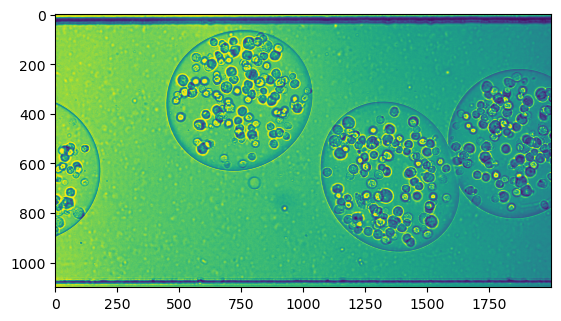

In [3]:
im = f[0]
plt.imshow(im)

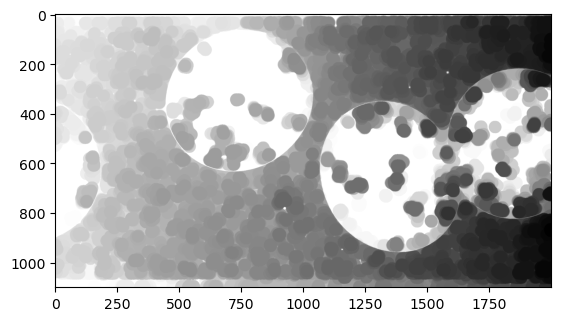

In [4]:
# closing

radius = 25  # You can adjust the radius based on your requirements
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))
bin_img = cv2.morphologyEx(im,  
                           cv2.MORPH_CLOSE, 
                           kernel, 
                           iterations=1) 
plt.imshow(bin_img, cmap = 'gray') 

In [9]:
bin_img = im

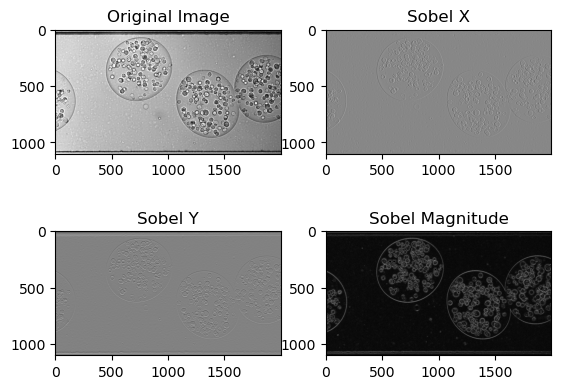

In [10]:
sobel_x = cv2.Sobel(bin_img, cv2.CV_64F, 1, 0, ksize=3)  # Sobel filter along the x-axis
sobel_y = cv2.Sobel(bin_img, cv2.CV_64F, 0, 1, ksize=3)  # Sobel filter along the y-axis

# Calculate the magnitude of the gradient
magnitude = np.sqrt(sobel_x**2 + sobel_y**2)

# Display the original image and the Sobel-filtered images
plt.subplot(2, 2, 1), plt.imshow(bin_img, cmap='gray'), plt.title('Original Image')
plt.subplot(2, 2, 2), plt.imshow(sobel_x, cmap='gray'), plt.title('Sobel X')
plt.subplot(2, 2, 3), plt.imshow(sobel_y, cmap='gray'), plt.title('Sobel Y')
plt.subplot(2, 2, 4), plt.imshow(magnitude, cmap='gray'), plt.title('Sobel Magnitude')

plt.show()

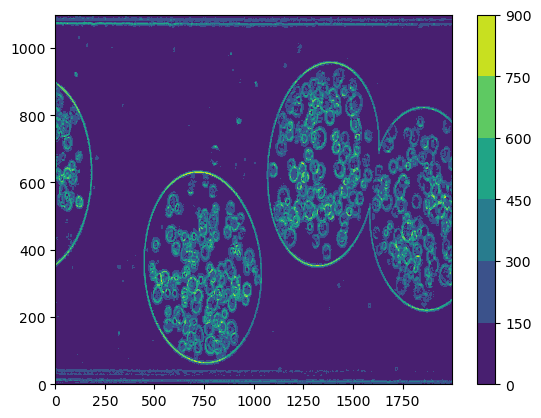

In [11]:
plt.contourf(magnitude)
plt.colorbar()

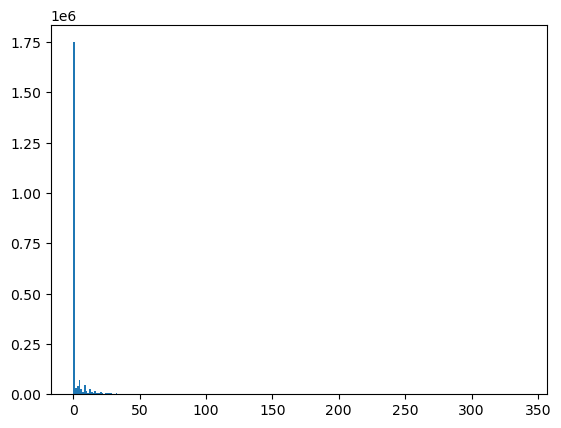

In [6]:
plt.hist(magnitude.reshape(-1), bins = 255)
plt.show()

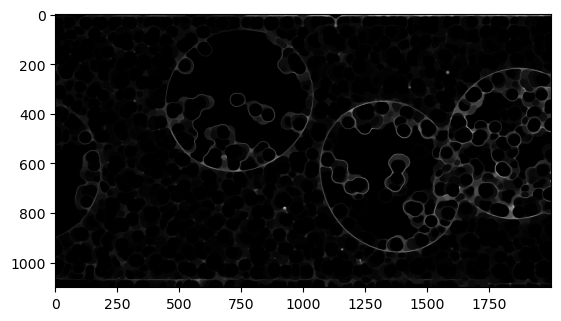

In [404]:
# closing

radius = 10  # You can adjust the radius based on your requirements
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))
magnitude2 = cv2.morphologyEx(magnitude,  
                           cv2.MORPH_CLOSE, 
                           kernel, 
                           iterations=1) 
plt.imshow(bin_img, cmap = 'gray') 

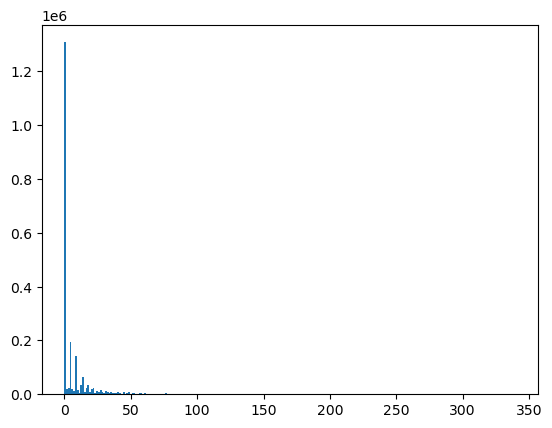

In [407]:
plt.hist(magnitude2.reshape(-1), bins = 255)
plt.show()

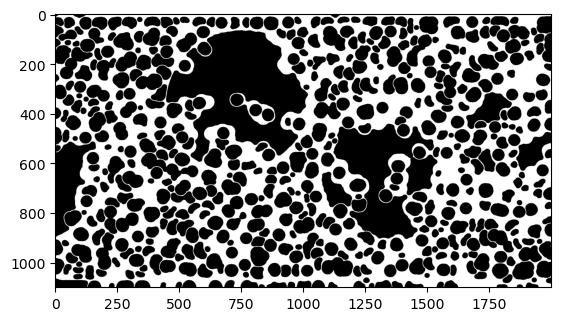

In [405]:
i = (magnitude2 > 0).astype(np.uint8) * 255
plt.imshow(i, cmap = 'gray')

In [14]:
circles = cv2.HoughCircles(im, cv2.HOUGH_GRADIENT, 1.3, 300, param1=120, param2=45, minRadius=200, maxRadius=400)

In [15]:
print(circles)

[[[ 718.25      358.15      273.32    ]
  [1331.85      612.94995   264.74    ]
  [1873.95      508.94998   289.05    ]
  [1054.95      403.65      399.15997 ]
  [1621.75      750.75      339.09998 ]
  [1578.85      388.05      384.86    ]
  [ 870.35      690.94995   399.15997 ]
  [ 420.55      425.74997   399.15997 ]
  [ 419.24997   731.25      399.15997 ]
  [1309.75      224.24998   399.15997 ]
  [1394.25      979.55      399.15997 ]
  [1078.35      932.74994   399.15997 ]
  [ 973.05       61.749996  399.15997 ]
  [ 463.44998    37.05      399.15997 ]
  [ 117.649994  410.15      399.15997 ]
  [1876.5499    910.64996   399.15997 ]
  [1768.6499    133.25      399.15997 ]
  [ 129.34999   811.85      280.47    ]
  [ 762.44995   976.94995   399.15997 ]
  [ 159.25      105.95      347.68    ]
  [ 364.65     1032.85      366.27    ]]]


In [ ]:
plt.hist()

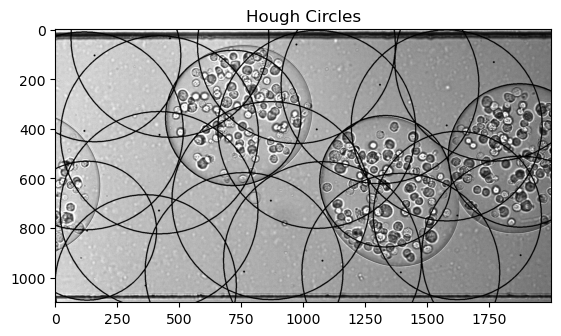

In [16]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Assuming circles is your array of detected circles
# Assuming img is your original image

circles = np.uint16(np.around(circles))

# Create a copy of the original image to draw circles without affecting it
img_with_circles = np.copy(im)

for c in circles[0, :]:
    # Draw the outer circle
    cv2.circle(img_with_circles, (c[0], c[1]), c[2], (0, 255, 0), 3)
    # Draw the center of the circle
    cv2.circle(img_with_circles, (c[0], c[1]), 1, (0, 0, 255), 5)

# Display the image with circles using plt
plt.imshow(cv2.cvtColor(img_with_circles, cv2.COLOR_BGR2RGB))
plt.title('Hough Circles')
plt.show()

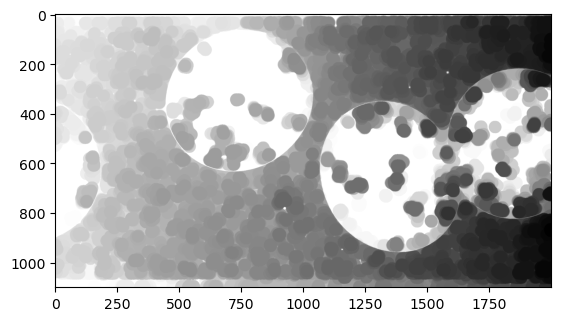

In [55]:
# closing

radius = 25  # You can adjust the radius based on your requirements
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))
im2 = cv2.morphologyEx(im,  
                           cv2.MORPH_CLOSE, 
                           kernel, 
                           iterations=1) 
plt.imshow(im2, cmap = 'gray') 

In [56]:
threshold = 50

canny_output = cv2.Canny(im2, threshold, threshold * 2)

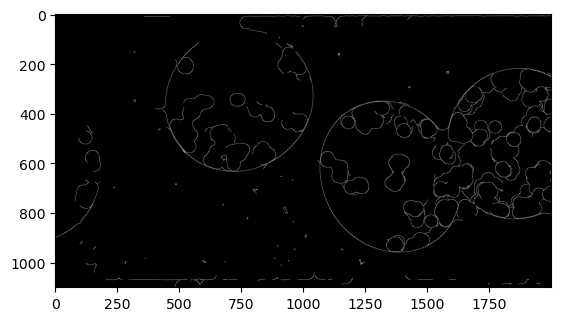

In [57]:
plt.imshow(canny_output, cmap = 'gray')

In [58]:
contours, _ = cv2.findContours(canny_output, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

In [62]:
img_with_ellipses = np.copy(im)

for contour in contours:
    if len(contour) >= 5:  # Fit ellipse only if there are at least 5 points
        ellipse = cv2.fitEllipse(contour)
        cv2.ellipse(img_with_ellipses, ellipse, (255, 255, 255), 2)  # Draw ellipse on the image


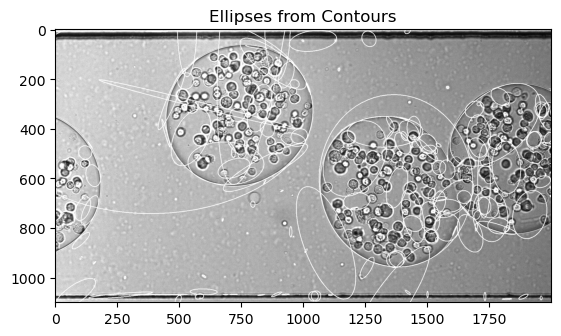

In [63]:
plt.imshow(img_with_ellipses, cmap='gray')
plt.title('Ellipses from Contours')
plt.show()

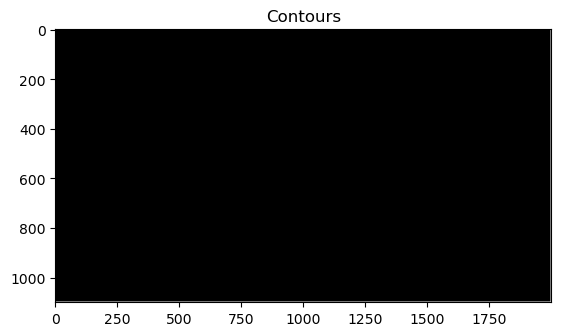

In [20]:
contour_image = np.zeros_like(im)

# Draw contours on the blank canvas
cv2.drawContours(contour_image, contours, -1, (255, 255, 255), 2)

# Display the image with contours using plt
plt.imshow(contour_image, cmap='gray')
plt.title('Contours')
plt.show()

## test Pipeline

0) background subtraction (not necessary I think)
1) closing (deal with noise)
2) dilate (upper bound on the estimate)
3) edge detection (Canny, Sobel or other)
4) detect shape (Circle transform, ...)
5) bounding box 

In [ ]:
class pipeline():
    def __init__(self):
        self.listElements = []
        self.params = []

    def _addElement(self, element, params):
        self.listElements.append(element)
        self.params.append(params)

    def _run(self, x):
        for i in range(len(self.listElements)):
            elem = self.listElements[i]
            p = self.params[i]
            x = elem(x, *p)

        return x

In [216]:
def pipe(image):
    ## Bsub done before
    
    ## closing

    radius = 25  # to change
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))
    im2 = cv2.morphologyEx(image,  
                            cv2.MORPH_CLOSE, 
                            kernel, 
                            iterations=1)


    ## dilate

    radius = 10  # to change
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))

    im3 = cv2.dilate(im2, kernel, iterations=1) 


    ## edge detection

    threshold = 2

    canny_output = cv2.Canny(im3, threshold, threshold * 2)

    ## hough circle transform

    circles = cv2.HoughCircles(canny_output, cv2.HOUGH_GRADIENT, 1.3, 500, param1=120, param2=45, minRadius=250, maxRadius=400)

    return circles

In [138]:
nb = 0

im = f[nb + 5]
bg = bMap[nb].astype(np.uint8)

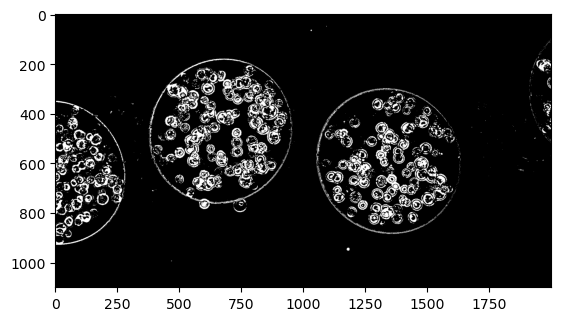

In [139]:
plt.imshow(bg, cmap='gray')
plt.show()

In [144]:
radius = 25  # to change
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))
im2 = cv2.morphologyEx(bg,  
                        cv2.MORPH_CLOSE, 
                        kernel, 
                        iterations=1) 


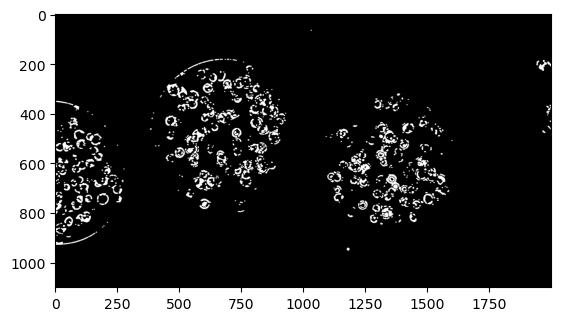

In [145]:
plt.imshow(im2, cmap = 'gray') 
plt.show()

In [188]:
radius = 10  # to change
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))

im3 = cv2.dilate(im2, kernel, iterations=1) 


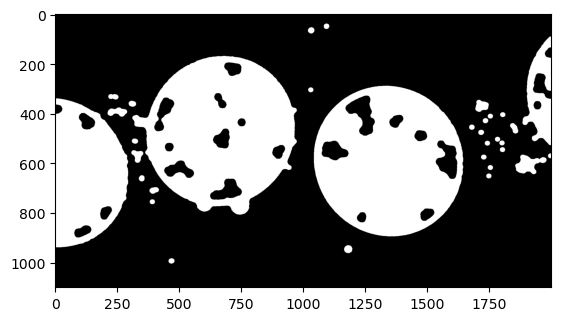

In [189]:
plt.imshow(im3, cmap = 'gray')
plt.show()

In [190]:
threshold = 2

canny_output = cv2.Canny(im3, threshold, threshold * 2)

[  0 255]


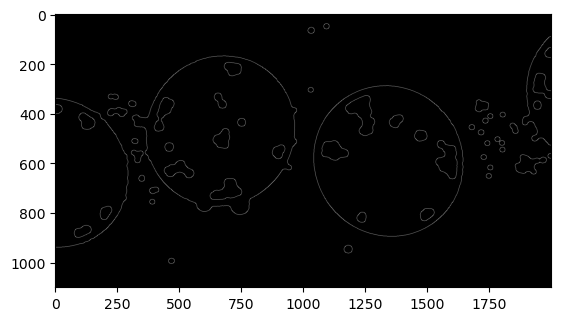

In [191]:
plt.imshow(canny_output, cmap = 'gray')

In [214]:
circles = cv2.HoughCircles(canny_output, cv2.HOUGH_GRADIENT, 1.1, 500, param1=120, param2=45, minRadius=250, maxRadius=400)

[[[1353.55     605.55     290.59   ]
  [ 659.45     462.55002  306.98   ]
  [  11.55     660.55     281.57   ]]]


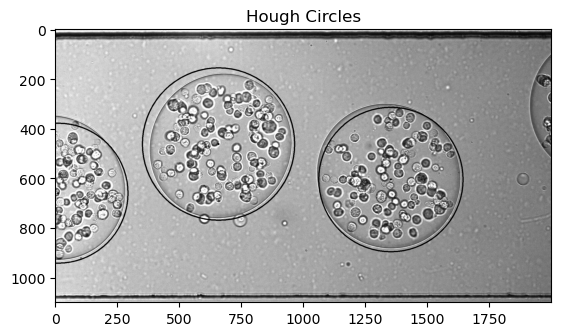

In [215]:
print(circles)

import cv2
import numpy as np
from matplotlib import pyplot as plt

# Assuming circles is your array of detected circles
# Assuming img is your original image

circles = np.uint16(np.around(circles))

# Create a copy of the original image to draw circles without affecting it
img_with_circles = np.copy(im)

for c in circles[0, :]:
    # Draw the outer circle
    cv2.circle(img_with_circles, (c[0], c[1]), c[2], (0, 255, 0), 3)
    # Draw the center of the circle
    cv2.circle(img_with_circles, (c[0], c[1]), 1, (0, 0, 255), 5)

# Display the image with circles using plt
plt.imshow(cv2.cvtColor(img_with_circles, cv2.COLOR_BGR2RGB))
plt.title('Hough Circles')
plt.show()

In [148]:
import matplotlib.animation as mat_anim
from IPython.display import HTML

def draw_frames(frames, bList, circles_list):
    if len(frames) != len(circles_list):
        raise Exception("The number of frames on each array doesn't match.")
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    plt.tight_layout()

    def update(frame):
        plt.suptitle(f"Frame {frame}")
        axs[0].clear() 
        axs[1].clear()  
        axs[2].clear()  
        axs[0].set_title("Original")
        axs[0].imshow(frames[frame], cmap='gray')  

        axs[1].imshow(bList[frame], cmap='gray') 

        f2 = np.copy(frames[frame])

        for c in circles_list[frame][0, :]:
            c = c.astype(int)
            cv2.circle(f2, (c[0], c[1]), c[2], (0, 255, 0), 3)
            # Draw the center of the circle
            cv2.circle(f2, (c[0], c[1]), 1, (0, 0, 255), 5)

        axs[2].imshow(cv2.cvtColor(f2, cv2.COLOR_BGR2RGB))
        axs[2].set_title("Circles")
        return axs

    return mat_anim.FuncAnimation(fig=fig, func=update, frames=len(frames), interval=500)


In [178]:
for c in circles[0, :]:
    # Draw the outer circle
    cv2.circle(img_with_circles, (c[0], c[1]), c[2], (0, 255, 0), 3)
    # Draw the center of the circle
    cv2.circle(img_with_circles, (c[0], c[1]), 1, (0, 0, 255), 5)

In [217]:
bList = []
fList = []
cList = []

for i in tqdm(range(len(bMap))):
    bg = bMap[i].astype(np.uint8)
    im = f[i+5]

    c = pipe(bg)

    bList.append(bg)
    fList.append(np.tile(im[:, :, np.newaxis], (1,1,3)))
    cList.append(c)




100%|██████████| 95/95 [00:24<00:00,  3.86it/s]


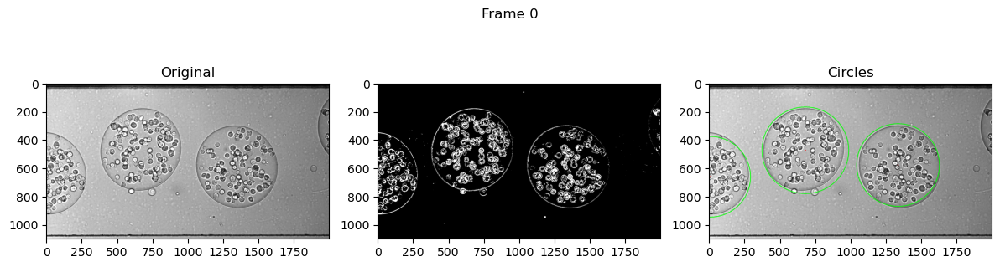

In [220]:
animation = draw_frames(fList, bList, cList)
HTML(animation.to_html5_video())

## test contours

In [5]:
im = f[5]
bg = bMap[0].astype(np.uint8)

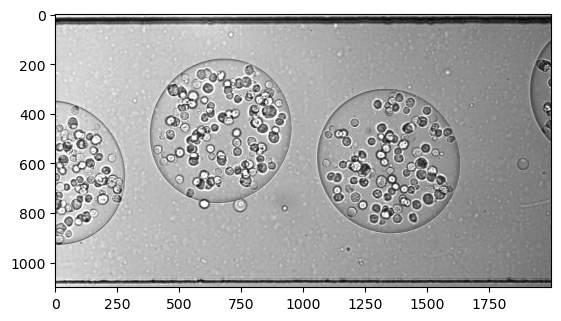

In [8]:
plt.imshow(im, cmap = 'gray')

In [235]:
radius = 30  # to change
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))
im2 = cv2.morphologyEx(im,  
                        cv2.MORPH_OPEN, 
                        kernel, 
                        iterations=1) 


(array([  613.,   230.,  6295.,  2949.,  1647.,  6835.,  7150., 17771.,
         6579.,  7722., 16743.,  7872.,  5023., 14726.,  3646., 16329.,
         6340.,  8069., 19700.,  5568.,  6265., 17737., 13129., 19824.,
        16672.,  4654., 18022., 10765.,  7481., 22323., 11334., 25142.,
        18018., 14366., 25564., 10412., 19761., 34486.,  8828., 23408.,
        11665., 11350., 16045., 10216.,  7893., 17239., 16705., 11562.,
        12555.,  7228., 13146., 11391., 10219.,  4504.,  9715., 10162.,
         8883.,  2823., 11827.,  8875., 16202., 10021.,  6772.,  7521.,
         3485.,  7879., 17506.,  5700., 17028.,  6856., 10256., 34729.,
        19860., 12345., 33209., 15290., 51289., 14248., 11564., 35922.,
        19799., 29775., 35302., 10743., 31349.,  8947., 11029., 14423.,
        28206.,  9448., 12764., 13719., 20799., 11442., 12025., 23561.,
        17225., 27685., 23399., 17977., 44334., 17468., 26096., 25406.,
        10485., 30878., 15919., 10567., 26846., 19951., 30394., 

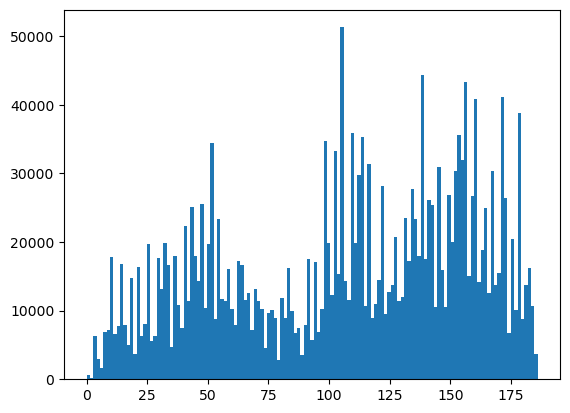

In [236]:
plt.hist(im2.reshape(-1),bins='auto')

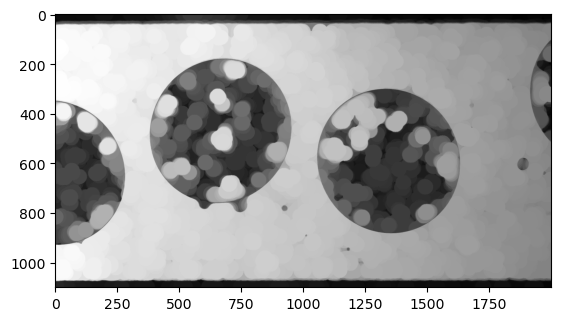

In [210]:
plt.imshow(im2, cmap='gray')

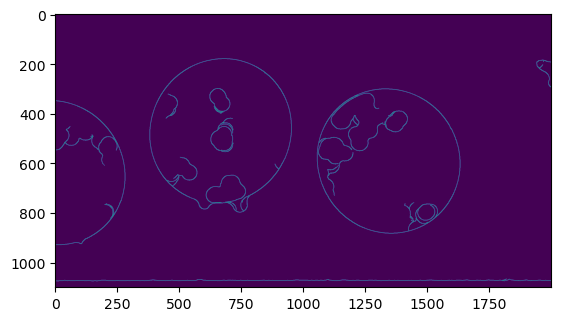

In [211]:
threshold1 = 10
edges = cv2.Canny(im2, 20, 400)   # find the best
#edges = cv2.Canny(im2, 3, 2)   # find the best

plt.imshow(edges)

In [160]:
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)


In [161]:
l = [len(c) for c in contours]

In [162]:
print(2*3.14 * 250)

1570.0


(array([10.,  1.,  2.,  0.,  2.]),
 array([  74.,  385.,  696., 1007., 1318., 1629.]),
 <BarContainer object of 5 artists>)

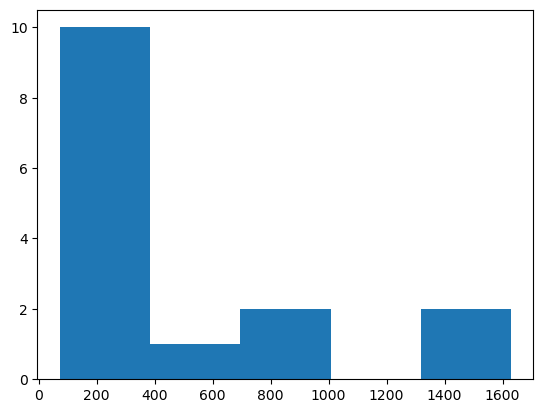

In [163]:
plt.hist(l, bins='auto')

In [178]:
print(np.argsort(l))

print(l[11])


[ 4 13  3  5 10  1 12  8  6  2  7  0  9 14 11]
1629


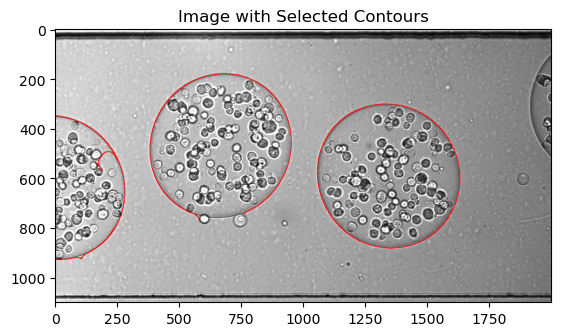

In [167]:
contour_image = np.tile(im.copy()[:, :, np.newaxis], (1,1,3))

# Iterate through all contours
for i in [9, 14, 11]:
    contour = contours[i]
    # Draw each contour on the blank image
    cv2.drawContours(contour_image, [contour], -1, (255, 0, 0), 2)


plt.imshow(contour_image)
plt.title('Image with Selected Contours')
plt.show()

In [233]:
def pipe(image):

    # DEAL WITH small cells
    radius = 30  # to change
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))
    im2 = cv2.morphologyEx(image,  
                            cv2.MORPH_OPEN, 
                            kernel, 
                            iterations=1) 

    
    # edge detection
    edges = cv2.Canny(im2, 20, 400)   # find the best


    #find contours
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    largeContours = []
    thresh = 1000           #
    for i in range(len(contours)):
        if len(contours[i]) > thresh:
            largeContours.append(contours[i])


    return largeContours

In [234]:
bList = []
fList = []
cList = []

for i in tqdm(range(len(f))):
    cont = []
    im = f[i]

    contours = pipe(im)

    print(len(contours))

    fList.append(np.tile(im[:, :, np.newaxis], (1,1,3)))
    cont.append(contours)



  1%|          | 1/100 [00:00<00:33,  2.92it/s]

2


  2%|▏         | 2/100 [00:00<00:29,  3.38it/s]

3
2


  4%|▍         | 4/100 [00:01<00:23,  4.05it/s]

1


  5%|▌         | 5/100 [00:01<00:24,  3.89it/s]

1


  6%|▌         | 6/100 [00:01<00:25,  3.70it/s]

2
2


  8%|▊         | 8/100 [00:02<00:21,  4.24it/s]

1
2


 10%|█         | 10/100 [00:02<00:19,  4.51it/s]

3


 11%|█         | 11/100 [00:02<00:22,  3.88it/s]

2
1


 13%|█▎        | 13/100 [00:03<00:19,  4.39it/s]

1
1


 15%|█▌        | 15/100 [00:03<00:18,  4.69it/s]

1
2


 17%|█▋        | 17/100 [00:04<00:18,  4.45it/s]

3
3


 20%|██        | 20/100 [00:04<00:16,  4.97it/s]

1
3


 21%|██        | 21/100 [00:04<00:15,  5.03it/s]

2
1


 23%|██▎       | 23/100 [00:05<00:17,  4.51it/s]

2


 24%|██▍       | 24/100 [00:05<00:17,  4.46it/s]

1


 25%|██▌       | 25/100 [00:05<00:19,  3.85it/s]

1


 26%|██▌       | 26/100 [00:06<00:18,  4.03it/s]

2


 27%|██▋       | 27/100 [00:06<00:20,  3.61it/s]

4


 28%|██▊       | 28/100 [00:06<00:19,  3.75it/s]

2


 29%|██▉       | 29/100 [00:06<00:17,  3.99it/s]

1


 29%|██▉       | 29/100 [00:07<00:17,  4.11it/s]


KeyboardInterrupt: 

In [231]:
print(cList[2])

[array([[[1913,  327]],

       [[1912,  328]],

       [[1905,  328]],

       ...,

       [[1968,  328]],

       [[1957,  328]],

       [[1956,  327]]], dtype=int32), array([[[1577,   35]],

       [[1576,   36]],

       [[1575,   36]],

       ...,

       [[1574,   37]],

       [[1575,   36]],

       [[1576,   36]]], dtype=int32)]


In [226]:
import matplotlib.animation as mat_anim
from IPython.display import HTML

def draw_frames(frames, contoursList):
    if len(frames) != len(contoursList):
        raise Exception("The number of frames on each array doesn't match.")
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))
    plt.tight_layout()

    def update(frame):
        plt.suptitle(f"Frame {frame}")
        axs[0].clear() 
        axs[1].clear()  
        axs[0].set_title("Original")
        axs[0].imshow(frames[frame], cmap='gray')  

        f2 = np.copy(frames[frame])

        for c in contoursList[frame]:
            contour = c[i]
            print(contour)
            # Draw each contour on the blank image
            cv2.drawContours(f2, [contour], -1, (255, 0, 0), 2)

        axs[1].imshow(cv2.cvtColor(f2, cv2.COLOR_BGR2RGB))
        axs[1].set_title("Circles")
        return axs

    return mat_anim.FuncAnimation(fig=fig, func=update, frames=len(frames), interval=500)


[[1672  303]]
[[985 236]]
[[1672  303]]
[[985 236]]
[[ 13 373]]
[[1890  438]]
[[1332  216]]
[[1733  431]]
[[1634  177]]
[[549 398]]
[[840 394]]
[[165 414]]
[[497 245]]
[[ 66 446]]
[[1413  393]]


KeyboardInterrupt: 

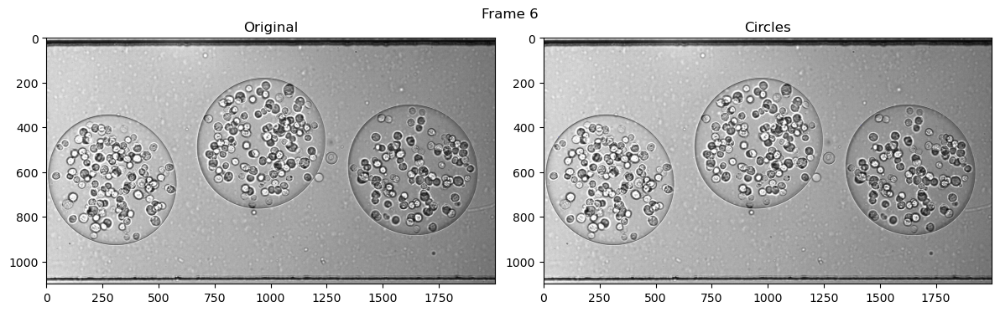

In [227]:
animation = draw_frames(fList, cList)
HTML(animation.to_html5_video())

## NEW IDEA TO GET RID OF THE SHAPE DEPENDENCY

In [6]:
im = f[5]
bg = bMap[0].astype(np.uint8)

NameError: name 'f' is not defined

In [249]:
radius = 30  # to change
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))
im2 = cv2.morphologyEx(im,  
                        cv2.MORPH_OPEN, 
                        kernel, 
                        iterations=1) 


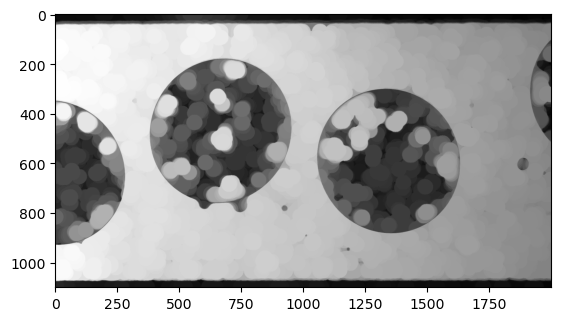

In [250]:
plt.imshow(im2, cmap = 'gray')

In [251]:
radius = 30  # to change
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))
im3 = cv2.morphologyEx(im,  
                        cv2.MORPH_CLOSE, 
                        kernel, 
                        iterations=1) 


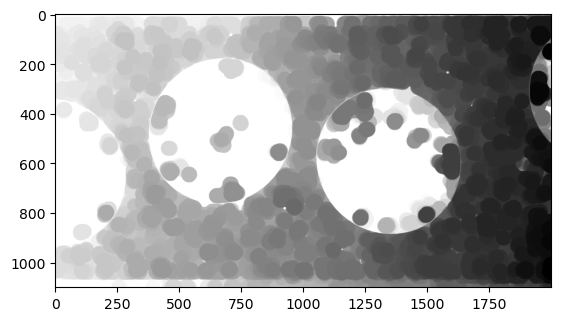

In [255]:
plt.imshow(im3, cmap = 'gray')
plt.show()

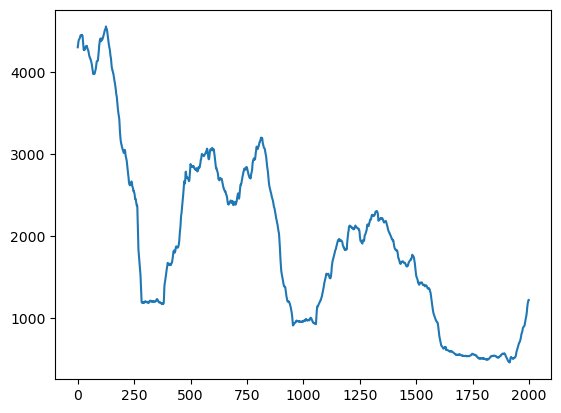

In [259]:
v = np.var(im2, axis=0)
plt.plot(v)
plt.show()

In [422]:
radius = 12  # to change
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))
imBg2 = cv2.morphologyEx(bg,  
                        cv2.MORPH_CLOSE, 
                        kernel, 
                        iterations=1) 


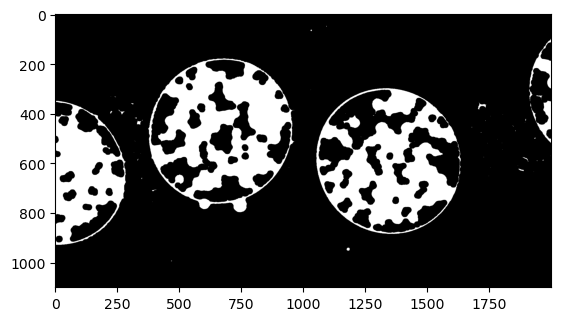

In [274]:
plt.imshow(imBg2, cmap = 'gray')
plt.show()

In [293]:
print(imBg2.shape)

(1100, 2000)


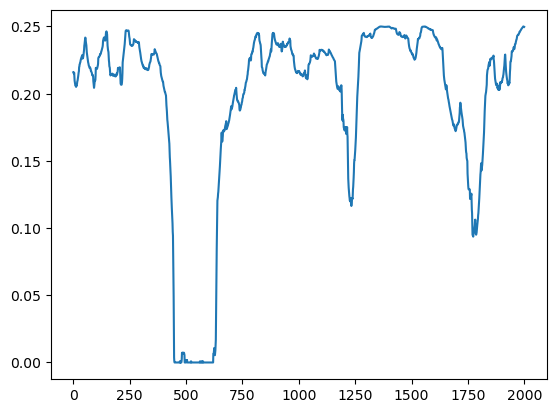

In [435]:
v = np.var(imBg2, axis=0)
plt.plot(v)
plt.show()

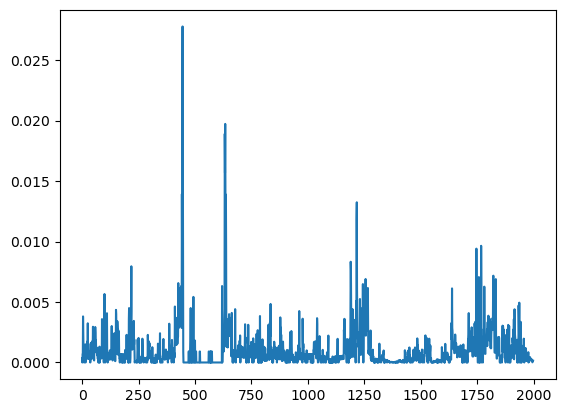

In [436]:
i = np.arange(len(v)-1)

plt.plot(np.abs(v[i+1] - v[i]))
plt.show()

In [277]:
inds = np.where(v > 0.02)[0]

In [303]:
def findComponents(inds):
    resList = []
    cList = []

    for i in range(len(inds)-1):
        if inds[i+1] == (inds[i]+1):
            cList.append(inds[i])
        else:
            cList.append(inds[i])
            resList.append(np.array(cList))
            cList = []

    resList.append(np.array(cList))

    return resList

In [304]:
inds2 = findComponents(inds)

In [290]:
print(im.shape[1])

2000


In [284]:
print(inds2[0])

[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245 24

1998
1998
1998
1998


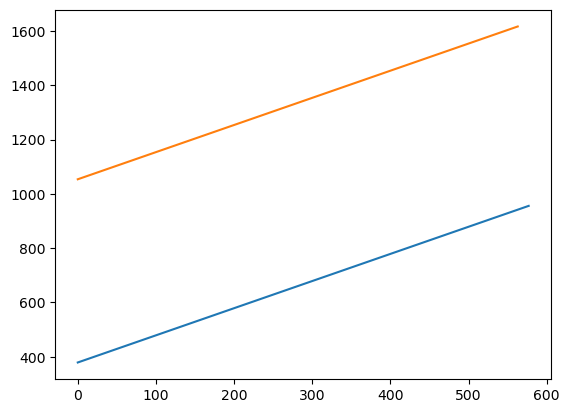

In [315]:
resL = []

for i in range(len(inds2)):
    if not len(np.where(inds2[i] == 0)[0]):
        print(im.shape[1]-2)
        if not len(np.where(inds2[i] == (im.shape[1]-2))[0]):

            if len(inds2[i]) > 100:
                # should not be possible to have less than 100 in cells
                plt.plot(inds2[i])
                resL.append(inds2[i])
plt.show()

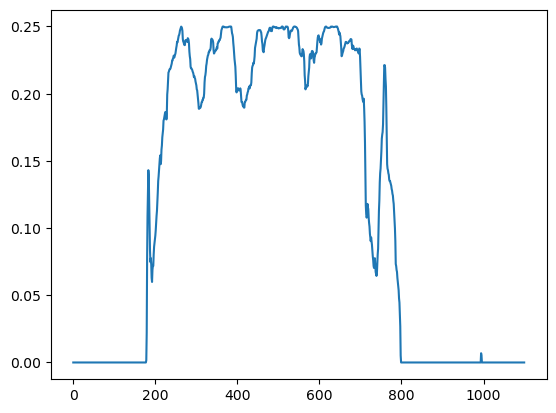

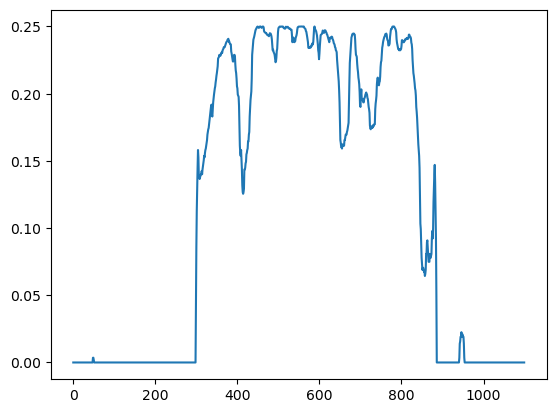

In [316]:
for i in range(len(resL)):
    v2 = np.var(imBg2[:, resL[i]], axis = 1)
    plt.plot(v2)
    plt.show()

In [317]:
indsY = np.where(v2 > 0.05)[0]



In [11]:
def findComponents(inds, im, L = 100):
    resList = []
    cList = []

    for i in range(len(inds)-1):
        if inds[i+1] == (inds[i]+1):
            cList.append(inds[i])
        else:
            cList.append(inds[i])
            cList = np.array(cList)
            if not len(np.where(cList == 0)[0]):
                if not len(np.where(cList == (im.shape[1]-2))[0]):          # just -2 in order to not take the last value

                    if len(cList) > L:
                        # should not be possible to have less than 100 in pixels
                        resList.append([np.min(cList), np.max(cList)])

            cList = []

    cList = np.array(cList)
    if not len(np.where(cList == 0)[0]):
        if not len(np.where(cList == (im.shape[1]-2))[0]):          # just -2 in order to not take the last value

            if len(cList) > L:
                # should not be possible to have less than 100 in pixels
                resList.append([np.min(cList), np.max(cList)])

    return resList

In [12]:
def findComponents(inds, im, L = 100, dec1 = 0, dec2 = 0):
    resList = []
    cList = []

    for i in range(len(inds)-1):
        if inds[i+1] == (inds[i]+1):
            cList.append(inds[i])
        else:
            cList.append(inds[i])
            cList = np.array(cList)
            if np.max(cList) > 450:
                if np.min(cList) < im.shape[1]-450:

                    if len(cList) > L:
                        # should not be possible to have less than 100 in pixels
                        resList.append([max(0, np.min(cList) - dec1), min(np.max(cList) + dec2, im.shape[1])])

            cList = []

    cList = np.array(cList)
    if np.max(cList) > 450:
        if np.min(cList) < im.shape[1]-450:          

            if len(cList) > L:
                # should not be possible to have less than 100 in pixels
                resList.append([max(0, np.min(cList) - dec1), min(np.max(cList) + dec2, im.shape[1])])

    return resList

In [45]:
def isolateCells1(im, thresh1 = 0.02, thresh2 = 0.05, L = 100, dec1 = 0, dec2 = 0):
    res = []
    
    v = np.var(im, axis=0)
    inds = np.where(v > thresh1)[0]

    indsX = findComponents(inds, im, L, dec1, dec2)


    for i in range(len(indsX)):
        v2 = np.var(im[:, indsX[i][0]:indsX[i][1]], axis = 1)

        indsY = np.where(v2 > thresh2)[0]

        res.append([[np.min(indsY), np.max(indsY)], indsX[i]])

    return res
    

In [4]:
%%timeit
res = isolateCells1(imBg2, thresh1 = 0.005, thresh2 = 0.05)


NameError: name 'imBg2' is not defined

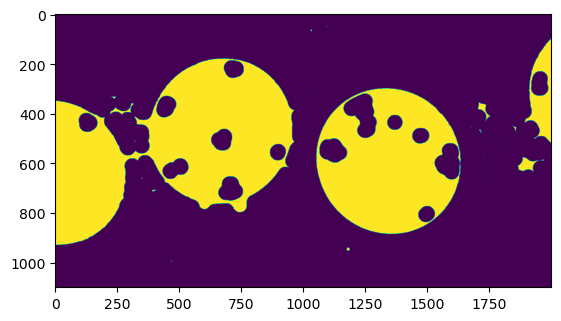

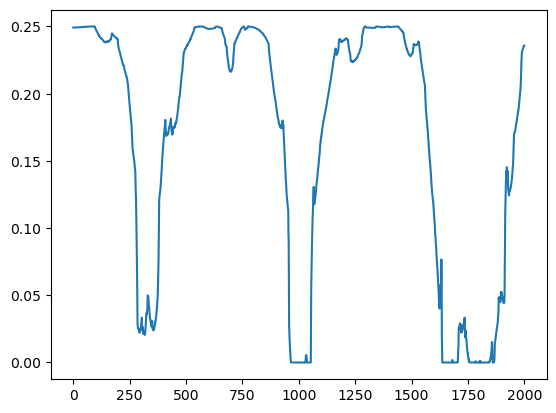

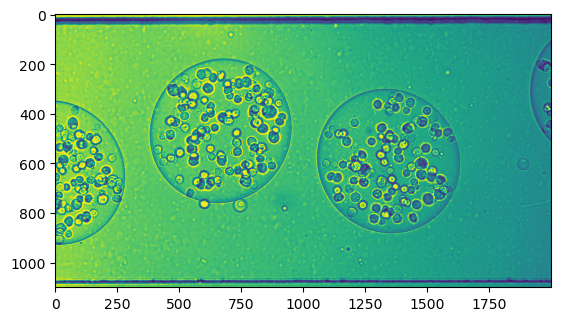

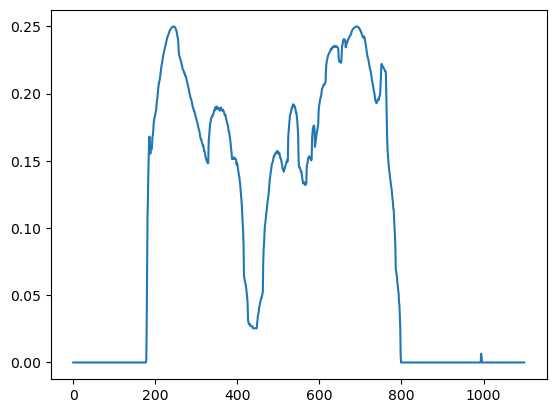

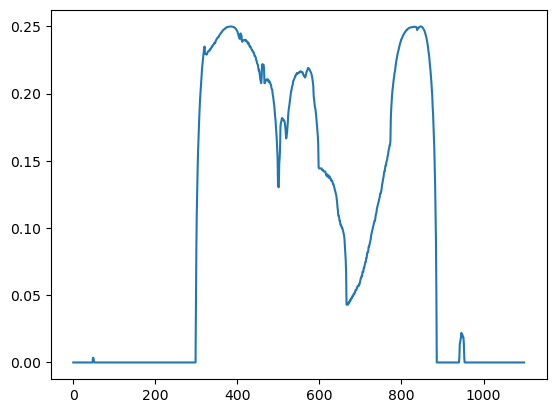

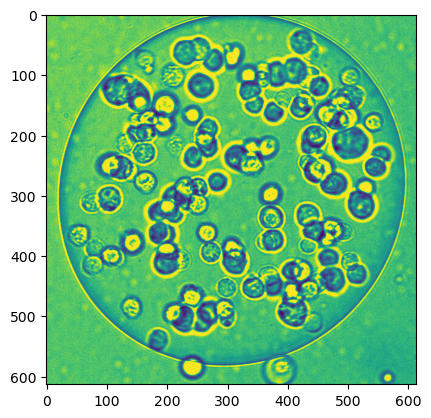

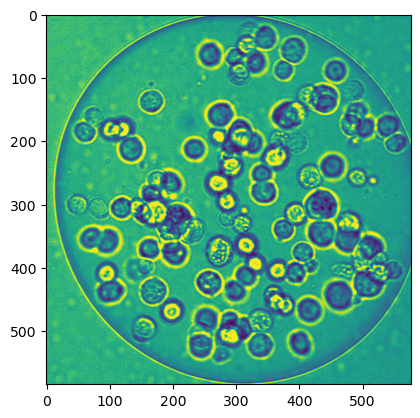

180 -- 793
360 -- 973
300 -- 885
1042 -- 1619


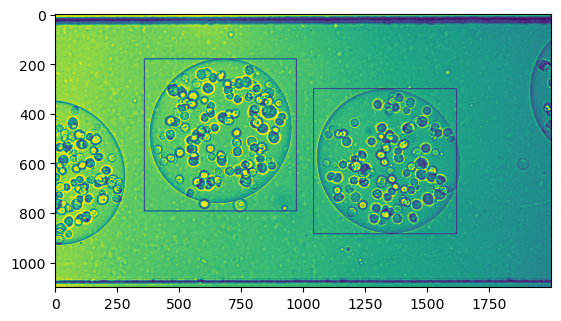

In [43]:
id = 0
imBg2 = bMap[id].astype(np.uint8)
im = f[id+5]

radius = 30  # to change
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1))
imBg2 = cv2.morphologyEx(imBg2,  
                        cv2.MORPH_CLOSE, 
                        kernel, 
                        iterations=1) 


plt.imshow(imBg2)
plt.show()

plt.plot(np.var(imBg2, axis=0))
plt.show()

plt.imshow(im)
plt.show()

res = isolateCells1(imBg2, thresh1 = 0.11, thresh2 = 0.05, dec1 = 20, dec2 = 20)
#res = isolateCells1(imBg2, thresh1 = 200, thresh2 = 100, dec1 = 20, dec2 = 20)


for nb in range(len(res)):
    plt.imshow(im[res[nb][0][0]:res[nb][0][1], res[nb][1][0]:res[nb][1][1]])
    plt.show()

f2 = im.copy()
for nb in range(len(res)):
    print(f'{res[nb][0][0]} -- {res[nb][0][1]}')

    print(f'{res[nb][1][0]} -- {res[nb][1][1]}')


    cv2.rectangle(f2, (res[nb][1][0], res[nb][0][0]), (res[nb][1][1], res[nb][0][1]), (0, 255, 0), 2)


plt.imshow(f2)
plt.show()

In [30]:
print(res)

for nb in len(res):

    plt.imshow(im[res[nb][0][0]:res[nb][0][1], res[nb][1][0]:res[nb][1][1]])
    plt.show()

[[[180, 794], [426, 951]], [[300, 885], [1052, 1610]]]


TypeError: 'int' object is not iterable

In [384]:
print(res)

[[[180, 793], [379, 956]], [[300, 885], [1054, 1617]]]


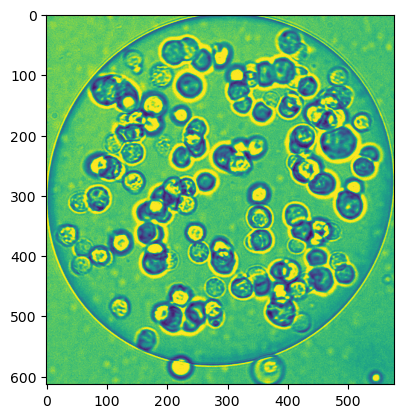

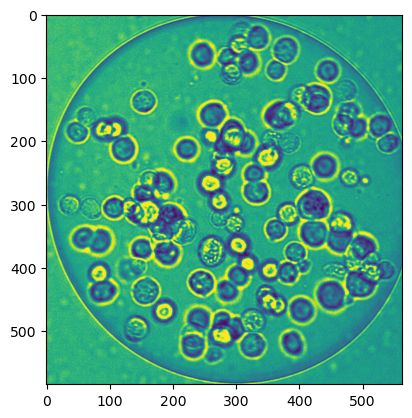

In [385]:
for nb in range(len(res)):
    plt.imshow(im[res[nb][0][0]:res[nb][0][1], res[nb][1][0]:res[nb][1][1]])
    plt.show()

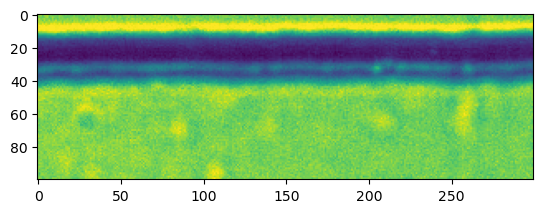

In [328]:
plt.imshow(im[0:100, 100:400])
plt.show()

In [457]:
print(np.where(imBg2 == 1))

(array([ 82,  82,  82, ..., 980, 980, 981], dtype=int64), array([1996, 1997, 1998, ...,   12,   13,    7], dtype=int64))
